In [1]:
import time
import random
import edges, guides, tiles, convex, coloring, plotting
import os
import shutil

Rewrite the algorithm to output all intermediates images, and create a folder for each inputs.
create a configuration file

In [ ]:
# half_tile: (int) a number between 4 and 30, representing the half size of mosaic tiles
# GAUSS: (int) a number between 0 and 8, used to blur the image before edge detection. Check "edges" image for a good value.
# EDGE_DETECTION: (str) either 'HED' or 'DiBlasi', representing the type of edge detection
# WITH_FRAME: (bool) True by default, used to control guidelines along image borders
# RAND_SIZE: (float) a number between 0 and 1, representing the portion of tile size which is added or removed randomly during construction
# MAX_ANGLE: (int) a number between 30 and 75, representing the maximum construction angle for tiles along roundings
# GAP_CHAIN_SPACING: (float) a number between 0.4 and 1.0, representing the spacing of gap filler chains
# MAKE_CONVEX: (bool) True by default, used to break concave into more realistic polygons
# COLOR_SCHEMA: (list) a list of string values representing the color schema to be used. The available options are 'wise_men', 'fish', 'cave_canem', 'nilotic', 'rooster', 'carpe_diem', 'Hyena'. Leave empty to plot all available options.
parameters = {
    'half_tile': 12,
    'GAUSS': 3,
    'EDGE_DETECTION': 'HED',
    'WITH_FRAME': True,
    'RAND_SIZE': 0.3,
    'MAX_ANGLE': 40,
    'GAP_CHAIN_SPACING': 0.5,
    'MAKE_CONVEX': True,
    'COLOR_SCHEMA': ['nilotic']
}

In [6]:
# Select filename of input image
input_dir = 'data/input_img/'
output_dir = 'data/output_img/'

input_file = 'Benoob_grape_ivy_roman_mural_a6277f2e-9fc8-46d5-ba09-0fb21dc423ce.png'
input_file = "children_of_the_omnissiah.jpg"
input_file = "C-19806__74501.jpg"
input_file = "grid_0.png"

output_file = output_dir + input_file.split('.')[0] + '_output.svg'
fname = input_dir+input_file

# Parameters
half_tile = 12 # 4...30 => half size of mosaic tile
GAUSS = 3 # 0...8 => blurs image before edge detection (check "edges" image for a good value)
EDGE_DETECTION = 'HED' # HED or DiBlasi
WITH_FRAME = True # default is True => control about guidelines along image borders
RAND_SIZE = 0.3 # portion of tile size which is added or removed randomly during construction
MAX_ANGLE = 40 # 30...75 => max construction angle for tiles along roundings
GAP_CHAIN_SPACING = 0.5 # 0.4 to 1.0 => spacing of gap filler chains
MAKE_CONVEX = True # default is True => break concave into more realistic polygons
COLOR_SCHEMA = ['nilotic',] # leave empty to plot all available or choose from 'wise_men',
                  #  'fish', 'cave_canem', 'nilotic', 'rooster', 'carpe_diem', 'Hyena'

# choose which image to plot
plot_list = [
    #'original',
    'edges', # CAN BE HELPFUL FOR ADJUSTING GAUSS PARAMETER
    'distances',
    'guidelines',
    'gradient',
    'angles_0to180',
    'polygons_chains',
    'used_up_space',
    'distance_to_tile',
    'filler_guidelines',
    'polygons_filler',
    'polygons_cut',
    'final', # <== MOST IMPORTANT
    'final_recolored', # <== OR THIS
    'statistics',
    ]


In [7]:

# Load image
t_start = time.time()
random.seed(0)
img0 = edges.load_image(fname, plot=plot_list)
h,w = img0.shape[0],img0.shape[1]
A0 = (2*half_tile)**2 # area of tile when placed along straight guideline
print (f'Estimated number of tiles: {2*w*h/A0:.0f}') # factor 2 since tiles can be smaller than default size


Size of input image: 900px * 900px
Estimated number of tiles: 2812


/workspaces/mosaic/edges.py:108: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  img = filters.gaussian(img, sigma=16, truncate=gauss/16, multichannel=True)


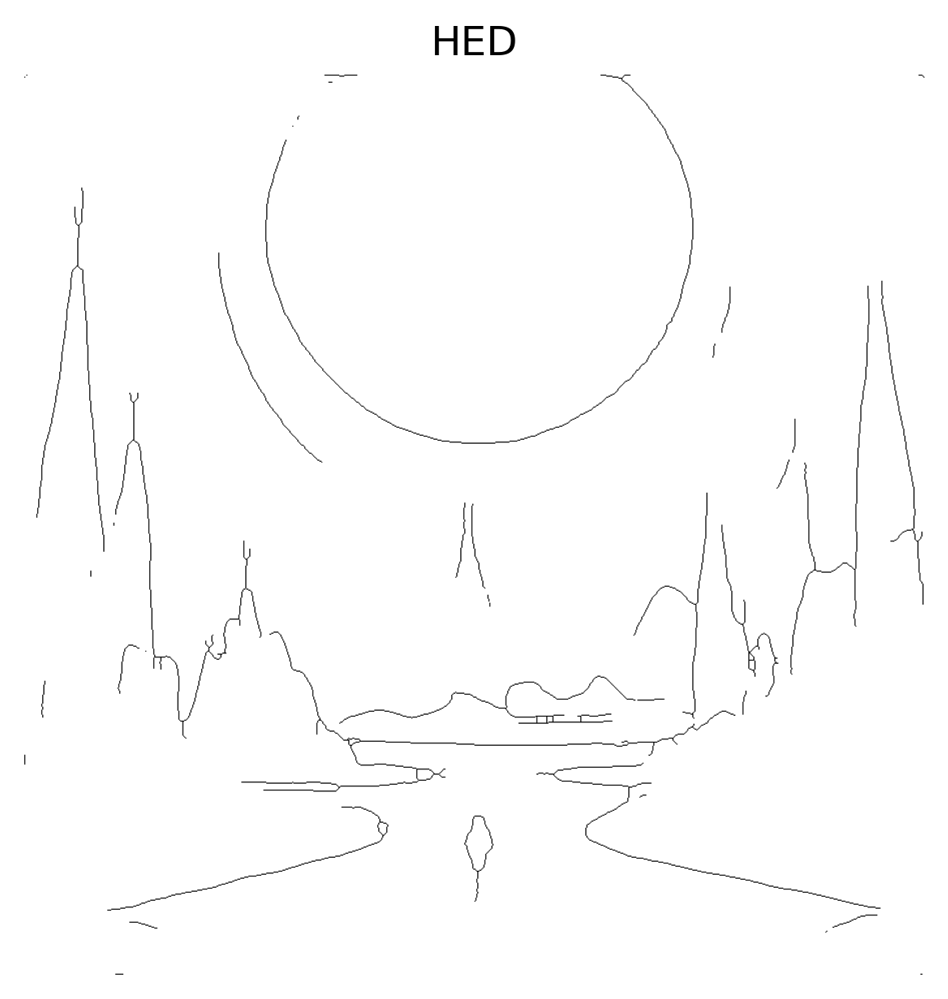

In [8]:
# Find edges of image objects
if EDGE_DETECTION == 'HED':
    img_edges = edges.edges_hed(img0, gauss=GAUSS, plot=plot_list)
elif EDGE_DETECTION == 'DiBlasi':
    img_edges = edges.edges_diblasi(img0, gauss=GAUSS, details=4, plot=plot_list)
else:
    raise ValueError('Parameter for edge detection mode not understood.')


if WITH_FRAME: 
    img_edges[0,:]=1; img_edges[-1,:]=1; img_edges[:,0]=1; img_edges[:,-1]=1


Pixel guidelines to chains with sorted points: 0.6s
Calculation of angle matrix: 1.2s


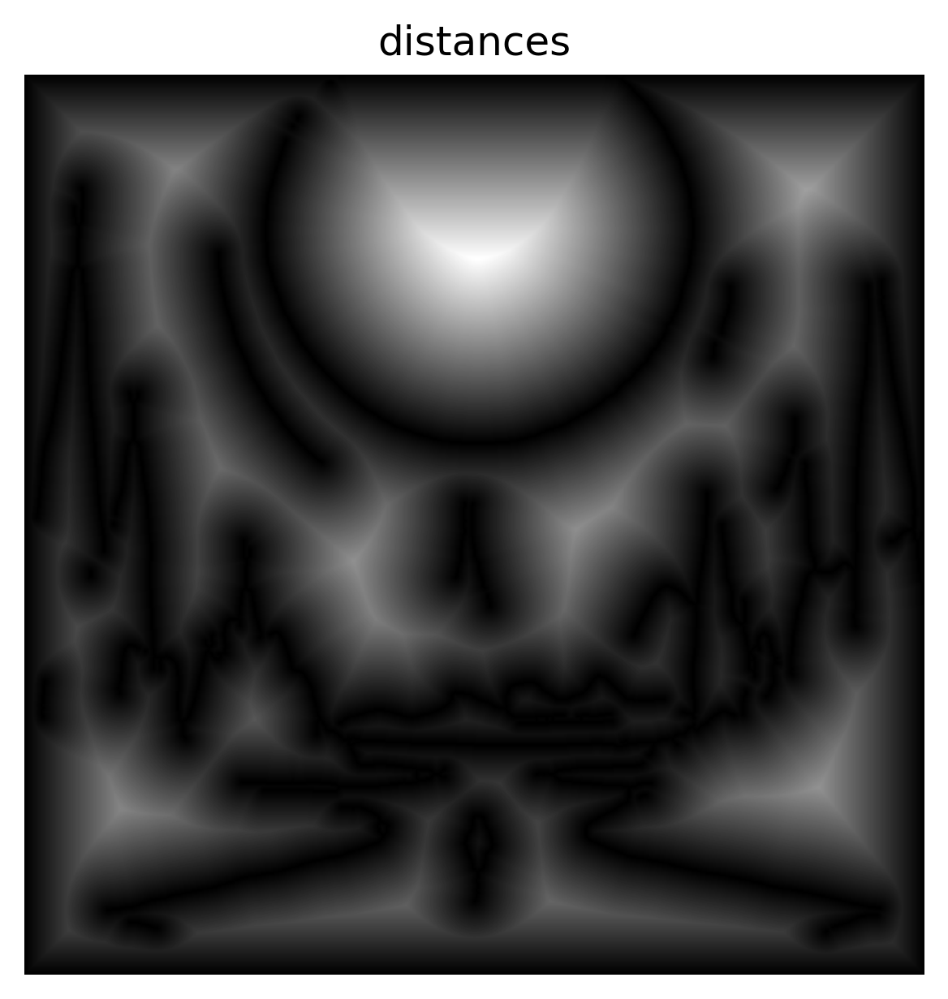

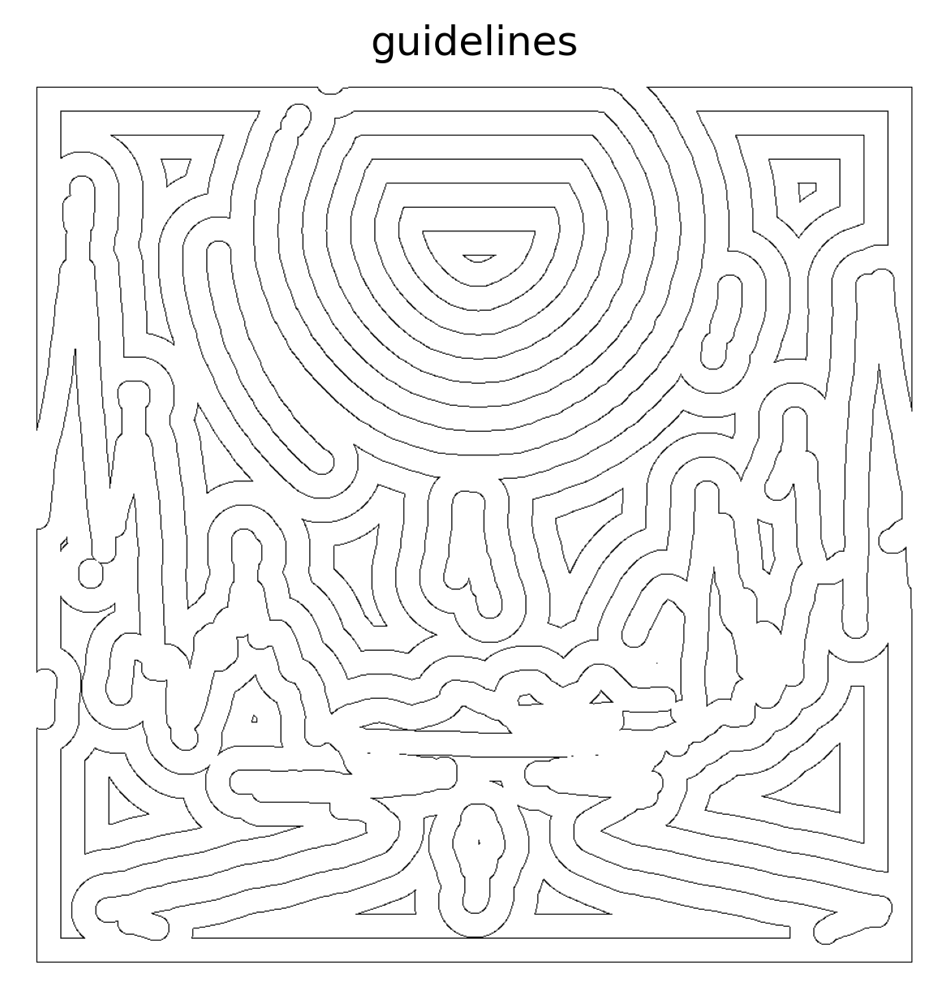

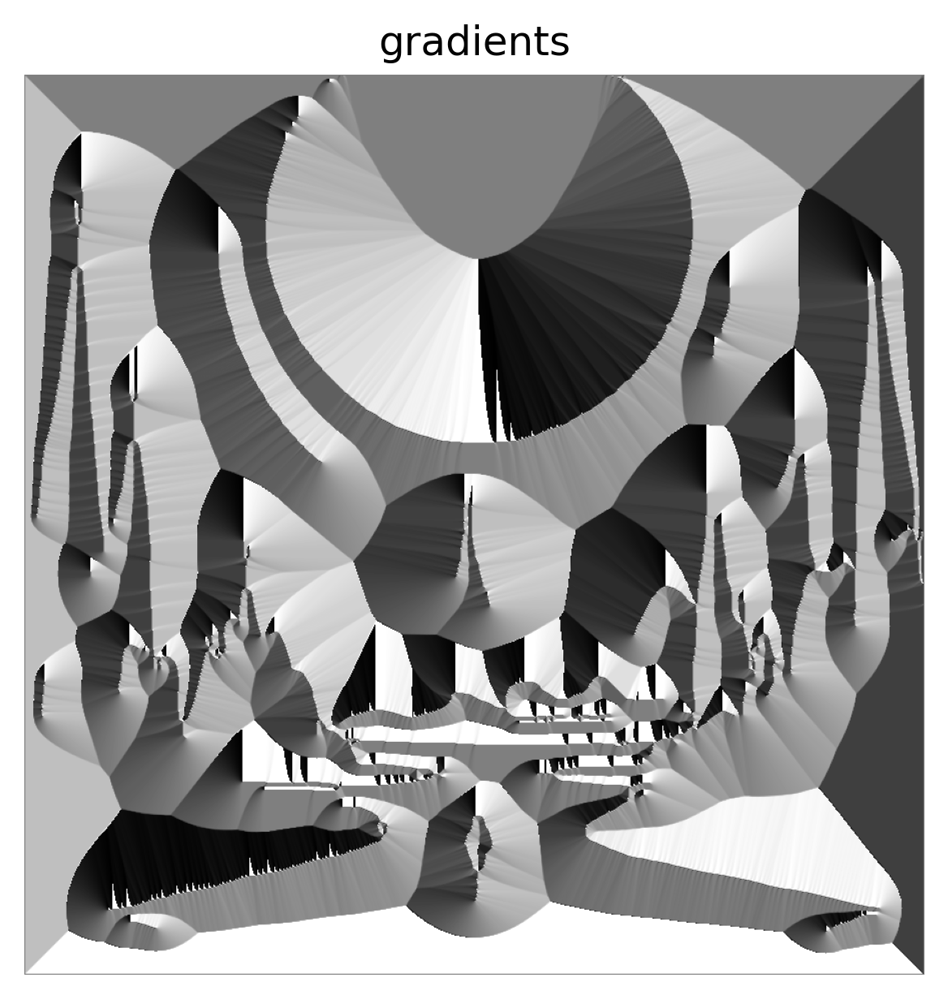

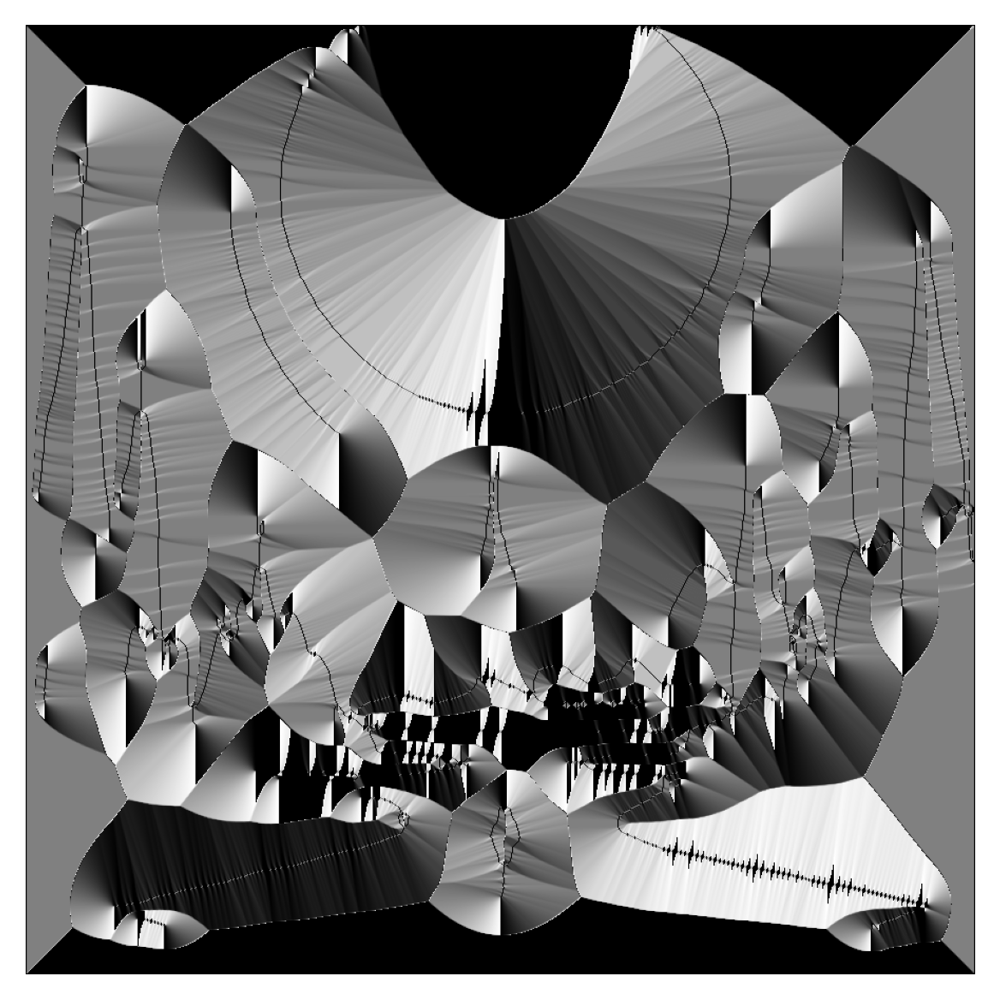

Placed 1501 tiles along guidelines 2.3s


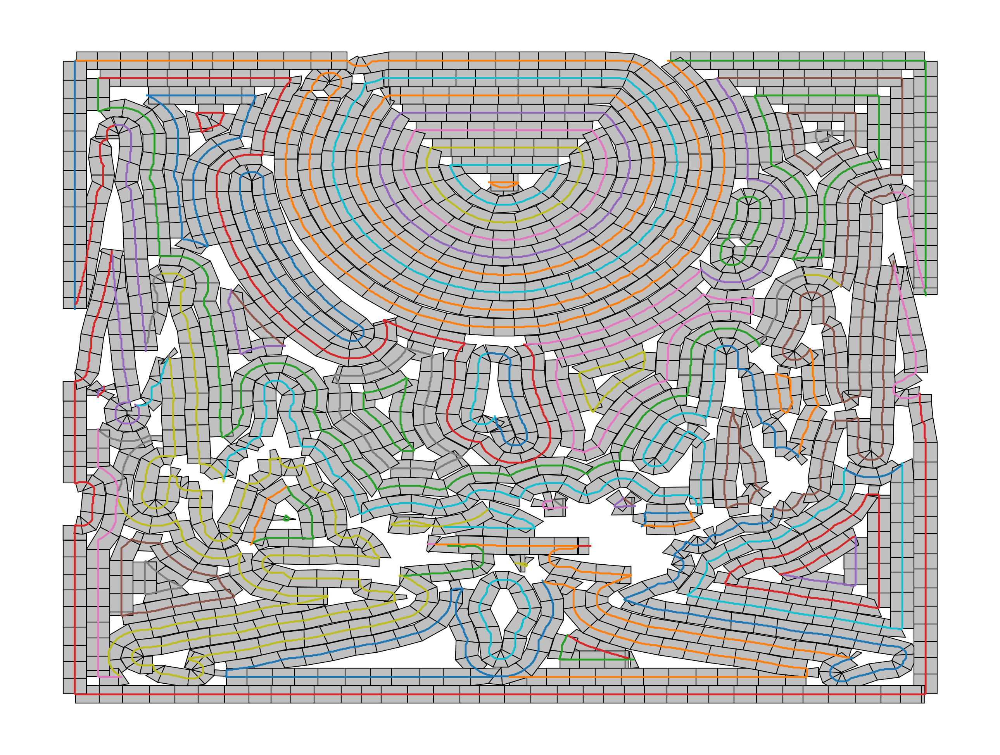

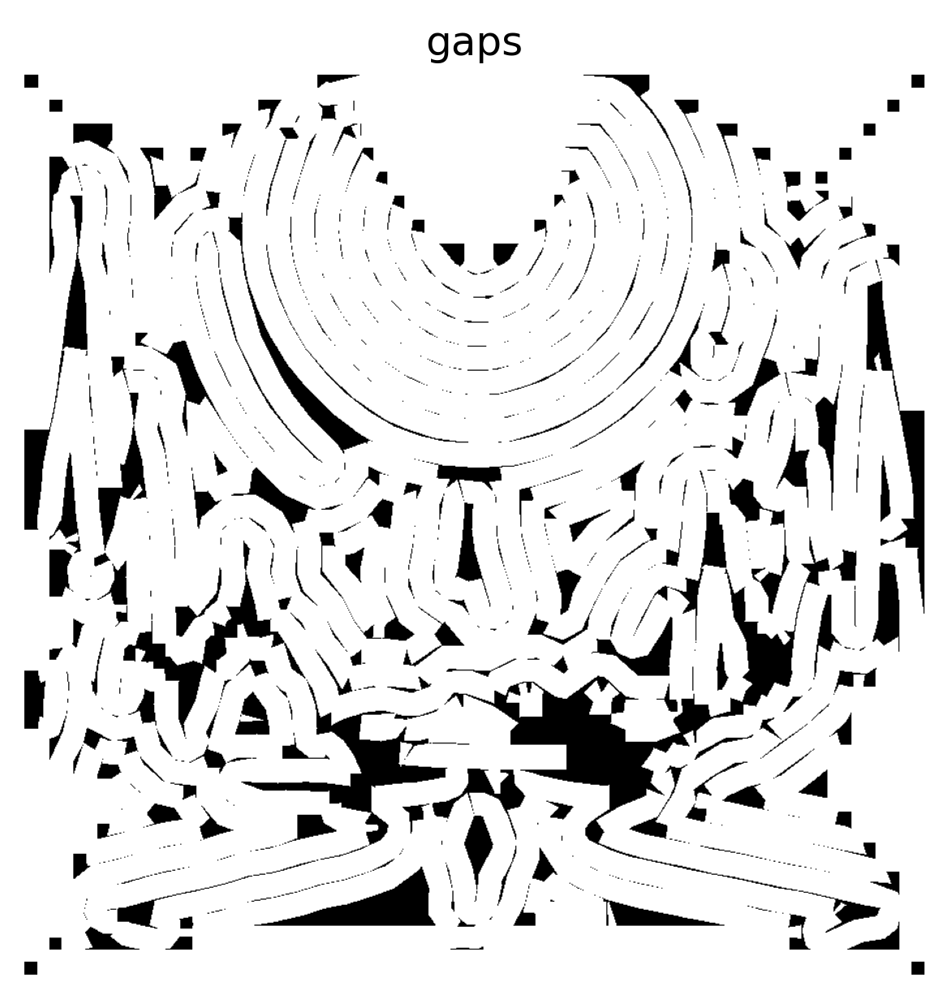

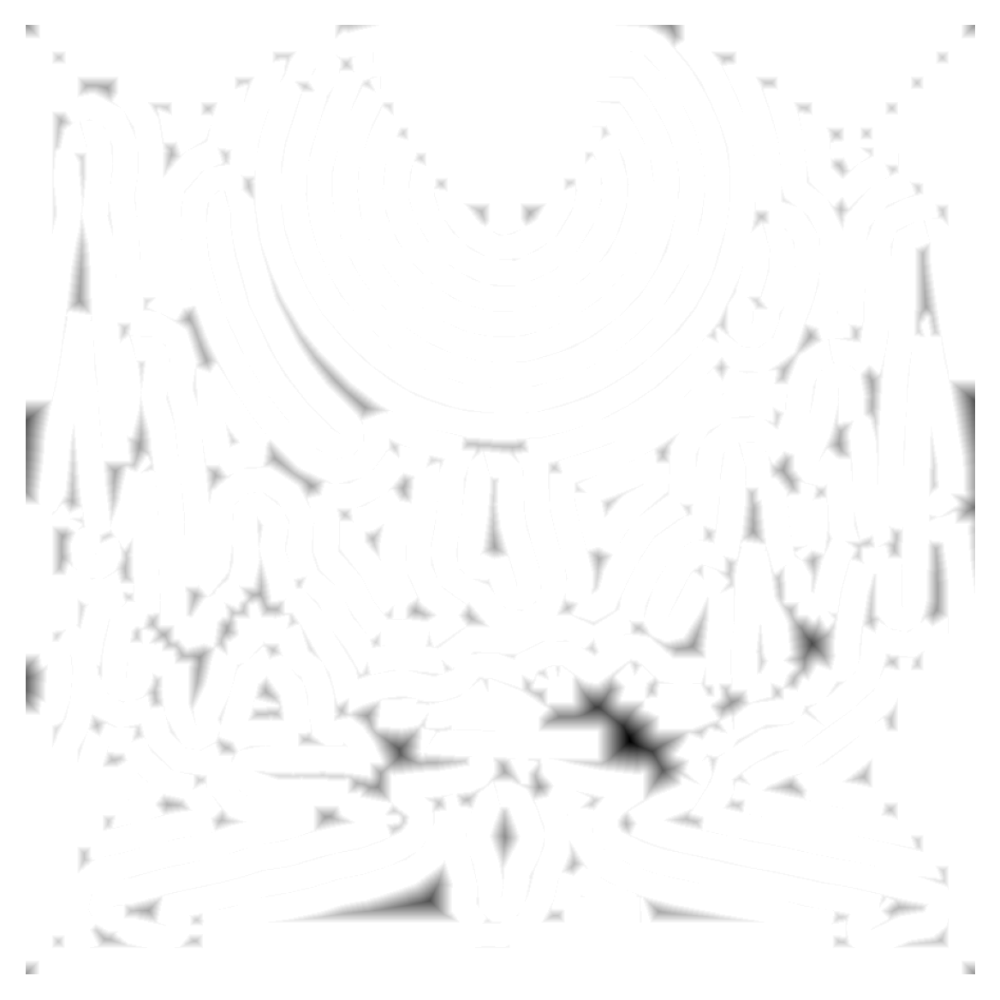

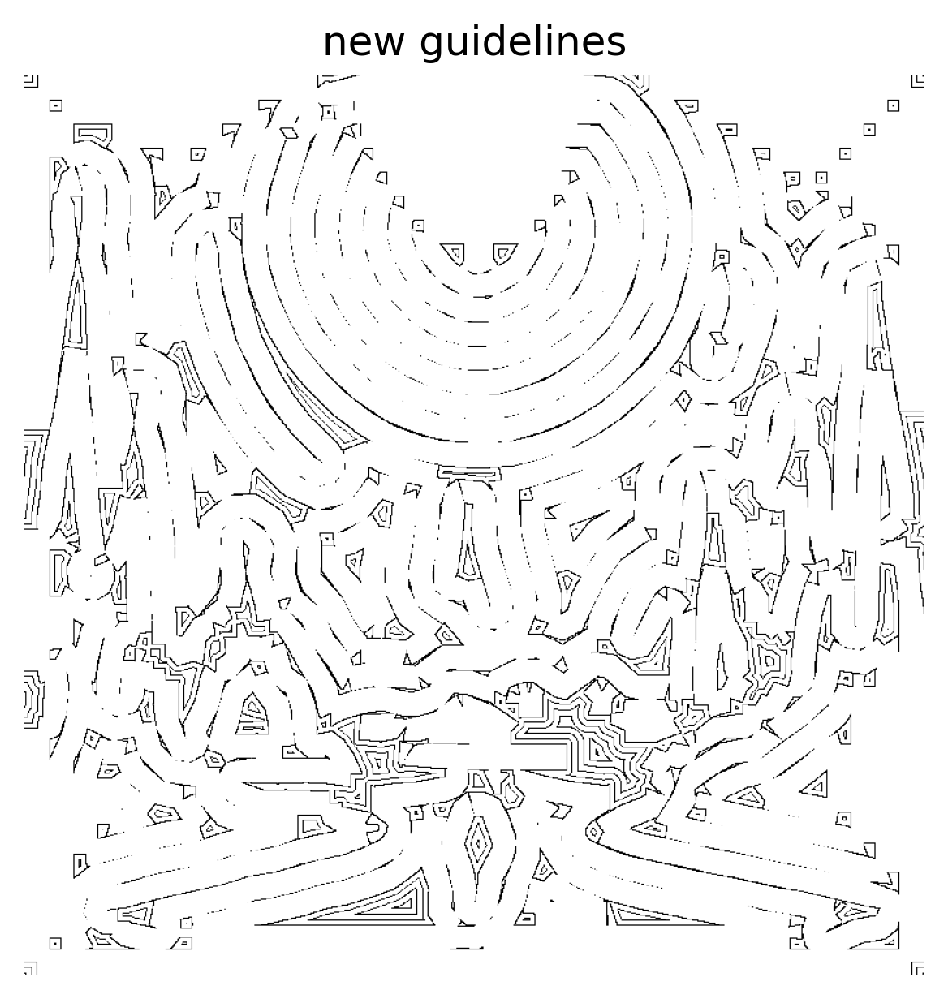

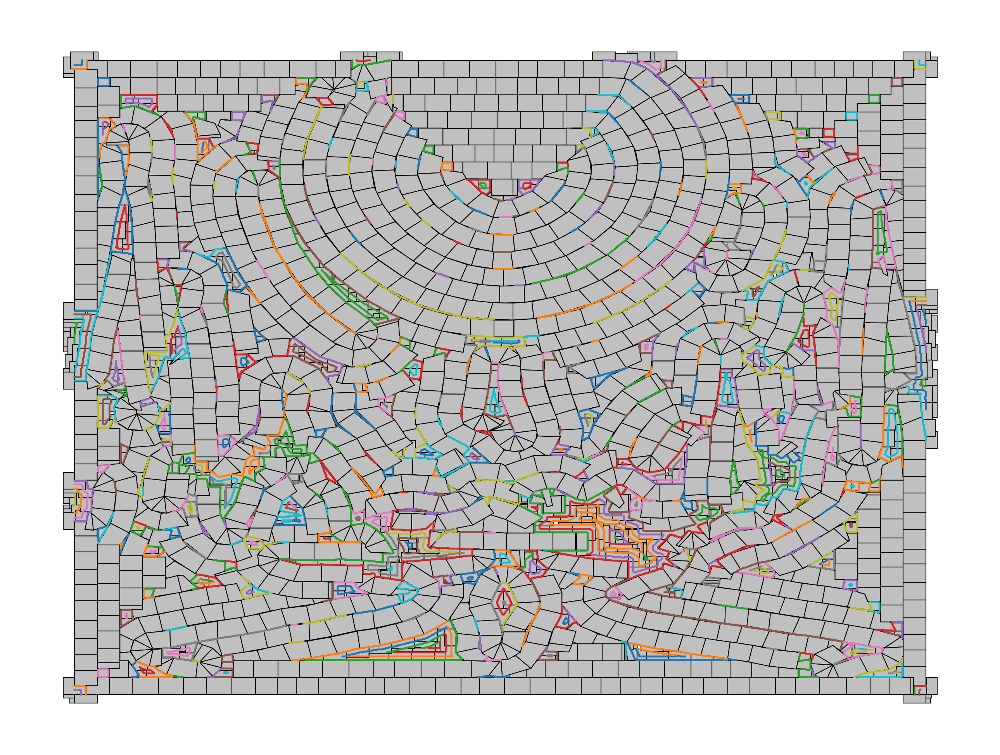

Added 834 tiles into gaps: 14.7s


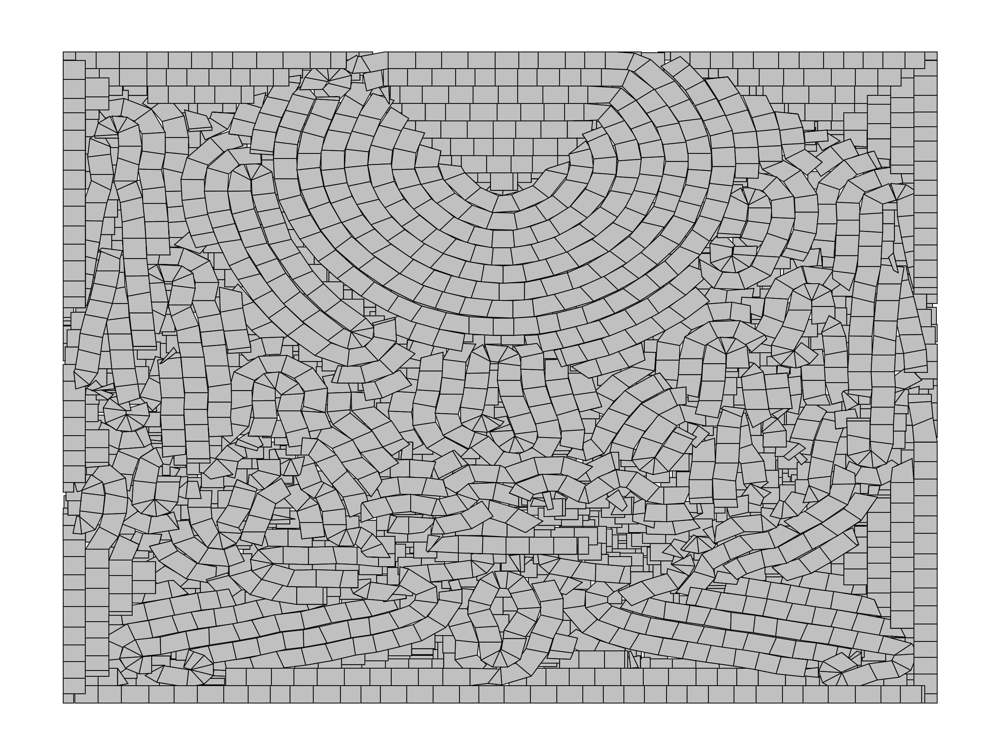

Up to 464 tiles beyond image borders were cut 3.3s
857 tiles converted to convex 1.8s
Dropped 95 small tiles 


In [9]:

# place tiles along chains
chains, angles_0to180 = guides.chains_and_angles(img_edges, half_tile=half_tile, plot=plot_list)
polygons_chains = tiles.place_tiles_along_chains(chains, angles_0to180, half_tile, RAND_SIZE, MAX_ANGLE, A0, plot=plot_list)

# find gaps and put more tiles inside
filler_chains = guides.chains_into_gaps(polygons_chains, h, w, half_tile, GAP_CHAIN_SPACING, plot=plot_list)
polygons_all = tiles.place_tiles_into_gaps(polygons_chains, filler_chains, half_tile, A0, plot=plot_list)

# remove parts of tiles which reach outside of image frame
polygons_all = tiles.cut_tiles_outside_frame(polygons_all, half_tile, img0.shape[0],img0.shape[1], plot=plot_list)

# convert concave polygons to convex (i.e. more realistic) ones
polygons_convex = convex.make_convex(polygons_all, half_tile, A0) if MAKE_CONVEX else polygons_all

# make polygons smaller, remove or correct strange polygons, simplify and drop very small polygons
polygons_post = tiles.irregular_shrink(polygons_convex, half_tile)
polygons_post = tiles.repair_tiles(polygons_post) 
polygons_post = tiles.reduce_edge_count(polygons_post, half_tile)
polygons_post = tiles.drop_small_tiles(polygons_post, A0)

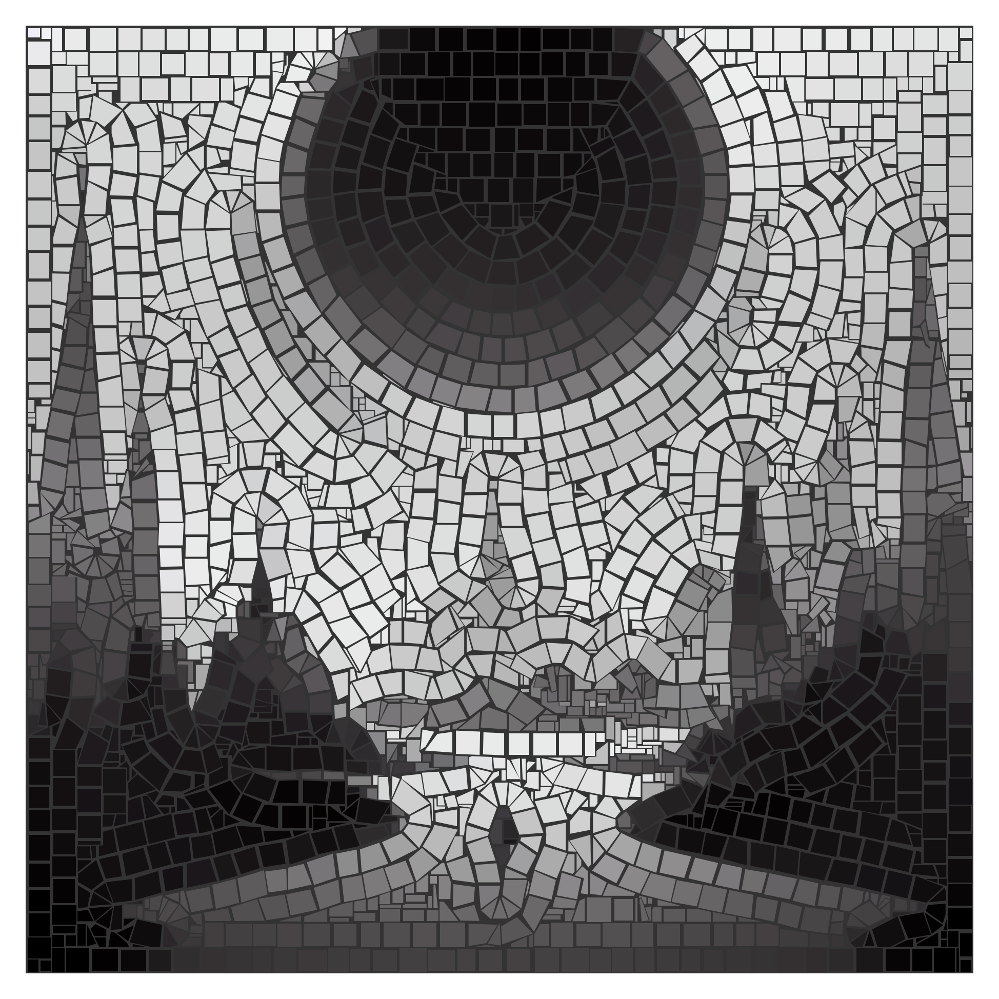

Final plot / saving: 3.9s


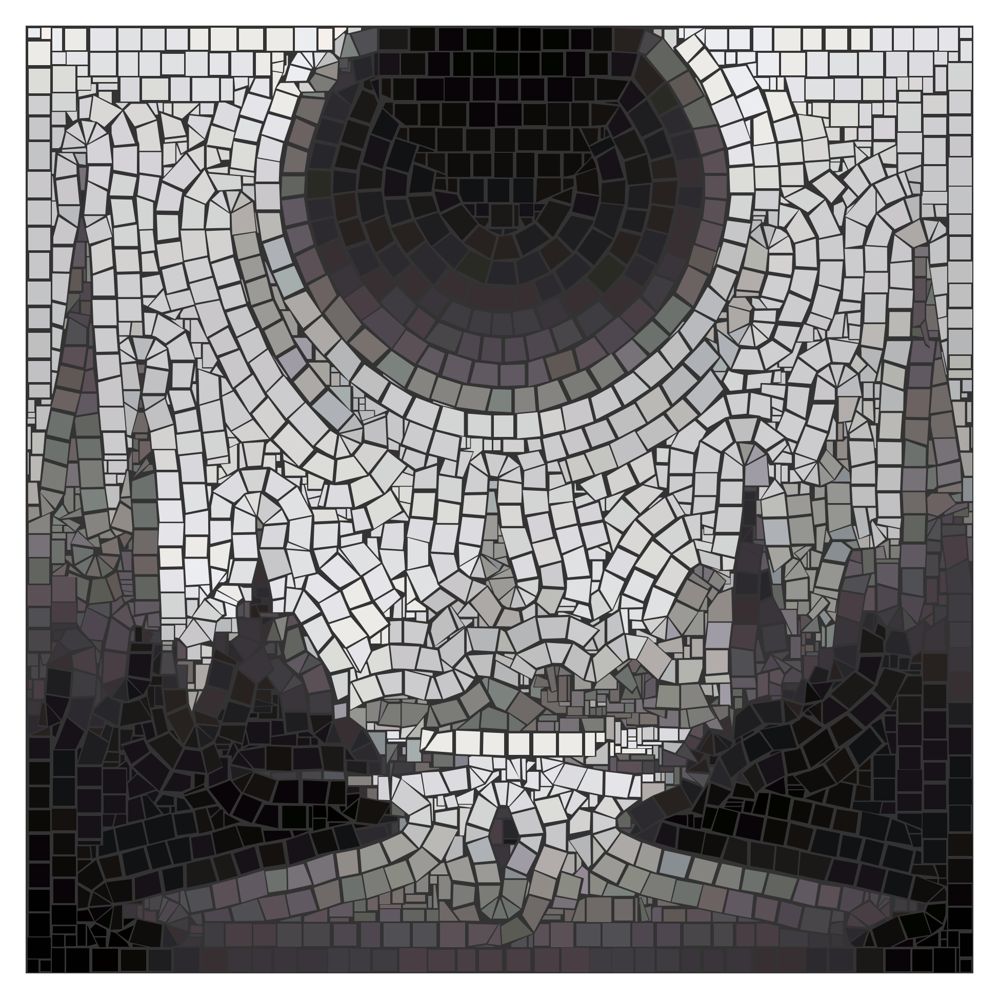

Total calculation time: 01 min 05 s
Final number of tiles: 2400


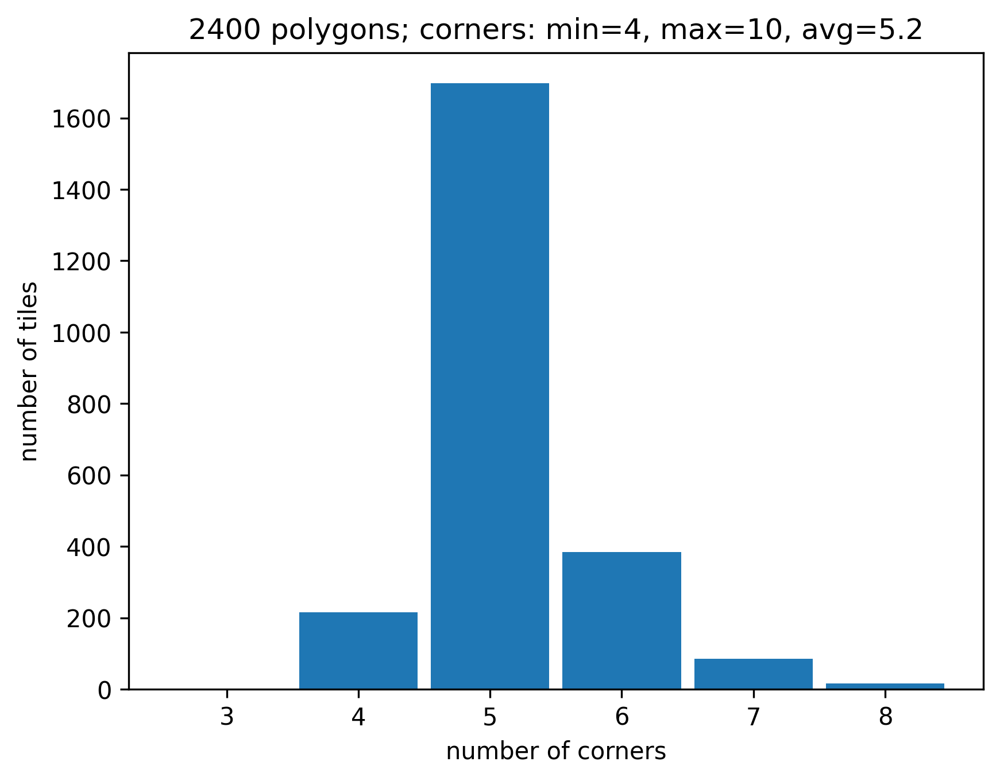

In [10]:

if 'final' in plot_list:
    # copy colors from original image
    colors = coloring.colors_from_original(polygons_post, img0, method='average')
    
    t0 = time.time()
    svg = plotting.draw_tiles(polygons_post, colors, h,w, background_brightness=0.2, return_svg=True, chains=None)
    if svg:
        with open(output_file, "w") as fn:
            fn.write(svg)
    print ('Final plot / saving:', f'{time.time()-t0:.1f}s') 

if 'final_recolored' in plot_list:
    color_dict = coloring.load_colors()
    keys = color_dict.keys() if not COLOR_SCHEMA else COLOR_SCHEMA
    for key in keys:
        new_colors = coloring.modify_colors(colors, 'source', color_dict[key])
        title = key if not COLOR_SCHEMA else ''
        plotting.draw_tiles(polygons_post, new_colors, h, w, background_brightness=0.2,
                            return_svg=None, chains=None, title=title)

if 'statistics' in plot_list:
    plotting.statistics(polygons_post)

print (f'Total calculation time: {time.strftime("%M min %S s", time.gmtime((time.time()-t_start)))}' ) # sek->min:sek
print ('Final number of tiles:', len(polygons_post))

